# Projet 4 : Prédiction de la consommation d'électricité
## Exploration
### Objectifs : - prédire les émissions de CO2 et la consommation totale d’énergie (2 variables à prédire)
### Objectif : - évaluer la pertinence de la variable ENERGY STAR Score
### Note à Seattle, le record en nombre d'étages c'est 76 selon wikipedia

### Notes : 
    - Après lecture du dictionnaire des données, les variables redondantes utilisées spour faire des l'imputation puis seront retirées (expression dans une autre unité).
    - Nos variables d'intérets sont: ENERGYSTARScore, TotalGHGEmissions, SiteEnergyUse(kBtu)

In [18]:
#librairies
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

In [19]:
pd.options.display.max_columns = 50
pd.options.display.max_rows = 50

In [53]:
#Importation jeux de données
df = pd.read_csv('data_cleaned.csv')

In [21]:
#importation groupe de varibales
import json
with open('group_var.txt', 'r') as f:
    groupe = json.load(f)

In [22]:
#Rappel du contenu des groupes
for nom, valeur in groupe.items():
    print(nom, ' : ', valeur)

var_id  :  ['OSEBuildingID', 'DataYear', 'PropertyName', 'TaxParcelIdentificationNumber']
var_quant  :  ['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA']
var_cat  :  ['CouncilDistrictCode', 'BuildingType', 'PrimaryPropertyType', 'Neighborhood', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType', 'DefaultData', 'ComplianceStatus']
var_obj  :  ['ListOfAllPropertyUseTypes']
var_adress  :  ['Latitude', 'Longitude']
var_target  :  ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']


In [23]:
for nom, valeur in groupe.items():
    exec(f'{nom} = {valeur}')

In [24]:
var_quant

['YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseTypeGFA']

#### Forme du jeux de données

In [25]:
df.shape

(3432, 39)

In [26]:
df.head(50)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),OtherFuelUse(kBtu),TotalGHGEmissions,DefaultData,Comments,ComplianceStatus,Address,City,State,ZipCode,Latitude,Longitude
0,1,2016,NONRESIDENTIAL,HOTEL,Mayflower park hotel,0659000030,405 Olive way Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1927,1.0,12.0,88434.0,0.0,88434.0,Hotel,HOTEL,88434.0,NAN,NaN,NAN,NaN,NaN,60.0,7.103895e+06,2.003882e+06,3946027.0,1276453.0,NaN,249.705,0,NaN,COMPLIANT,405 Olive way,Seattle,WA,98101.0,47.61220,-122.33799
1,2,2016,NONRESIDENTIAL,HOTEL,Paramount Hotel,0659000220,724 Pine street Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1996,1.0,11.0,103566.0,15064.0,88502.0,"Hotel, Parking, Restaurant",HOTEL,83880.0,PARKING,15064.0,RESTAURANT,4622.0,NaN,61.0,8.371084e+06,0.000000e+00,3242851.0,5145082.0,NaN,279.685,0,NaN,COMPLIANT,724 Pine street,Seattle,WA,98101.0,47.61317,-122.33393
2,3,2016,NONRESIDENTIAL,HOTEL,5673-The Westin Seattle,0659000475,1900 5th Avenue Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1969,1.0,41.0,959050.0,98359.0,860691.0,Hotel,HOTEL,756868.0,NAN,100000.0,NAN,0.0,NaN,43.0,7.285884e+07,2.156655e+07,49526664.0,1493800.0,NaN,2075.380,0,NaN,COMPLIANT,1900 5th Avenue,Seattle,WA,98101.0,47.61393,-122.33810
3,5,2016,NONRESIDENTIAL,HOTEL,HOTEL MAX,0659000640,620 STEWART ST Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1926,1.0,10.0,61320.0,0.0,61320.0,Hotel,HOTEL,61320.0,NAN,NaN,NAN,NaN,NaN,56.0,1.751195e+07,2.214446e+06,2768924.0,1811213.0,NaN,1111.385,0,NaN,COMPLIANT,620 STEWART ST,Seattle,WA,98101.0,47.61412,-122.33664
4,8,2016,NONRESIDENTIAL,HOTEL,WARWICK SEATTLE HOTEL (ID8),0659000970,401 LENORA ST Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1980,1.0,18.0,147735.0,37230.0,110505.0,"Hotel, Parking, Swimming Pool",HOTEL,123445.0,PARKING,68009.0,SWIMMING POOL,0.0,NaN,75.0,1.450085e+07,0.000000e+00,5368607.0,8803998.0,NaN,506.355,0,NaN,COMPLIANT,401 LENORA ST,Seattle,WA,98121.0,47.61375,-122.34047
5,9,2016,NONRESIDENTIAL COS,OTHER,West Precinct,0660000560,810 Virginia St Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1999,1.0,2.0,97288.0,37198.0,60090.0,Police Station,POLICE STATION,88830.0,NAN,NaN,NAN,NaN,NaN,NaN,1.206930e+07,0.000000e+00,7371434.0,4715182.0,NaN,303.215,0,NaN,COMPLIANT,810 Virginia St,Seattle,WA,98101.0,47.61623,-122.33657
6,10,2016,NONRESIDENTIAL,HOTEL,Camlin,0660000825,1619 9th Avenue Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1926,1.0,11.0,83008.0,0.0,83008.0,Hotel,HOTEL,81352.0,NAN,NaN,NAN,NaN,NaN,27.0,6.005818e+06,0.000000e+00,2811215.0,2947580.0,NaN,192.300,0,NaN,COMPLIANT,1619 9th Avenue,Seattle,WA,98101.0,47.61390,-122.33283
7,11,2016,NONRESIDENTIAL,OTHER,Paramount Theatre,0660000955,911 Pine St Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1926,1.0,8.0,102761.0,0.0,102761.0,Other - Entertainment/Public Assembly,OTHER - ENTERTAINMENT/PUBLIC ASSEMBLY,102761.0,NAN,NaN,NAN,NaN,NaN,NaN,6.362077e+06,2.276286e+06,3636655.0,385189.0,NaN,210.750,0,NaN,COMPLIANT,911 Pine St,Seattle,WA,98101.0,47.61327,-122.33136
8,12,2016,NONRESIDENTIAL,HOTEL,311wh-Pioneer Square,0939000080,612 2nd Ave Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1904,1.0,15.0,163984.0,0.0,163984.0,Hotel,HOTEL,163984.0,NAN,NaN,NAN,NaN,NaN,43.0,1.317878e+07,0.000000e+00,7297919.0,6425900.0,NaN,361.885,0,NaN,COMPLIANT,612 2nd Ave,Seattle,WA,98104.0,47.60294,-122.33263
9,13,2016,MULTIFAMILY MR (5-9),MID-RISE MULTIFAMILY,Lyon Building,0939000105,607 - 3rd Ave. Seattle WA 0 98101.0\n1 ...,7,DOWNTOWN,1910,1.0,6.0,63712.0,1496.0,62216.0,Multifamily Housing,MULTIFAMILY HOUSING,56132.0,NAN,NaN,NAN,NaN,NaN,1.0,4.580504e+06,1.

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3432 entries, 0 to 3431
Data columns (total 39 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3432 non-null   int64  
 1   DataYear                         3432 non-null   int64  
 2   BuildingType                     3432 non-null   object 
 3   PrimaryPropertyType              3432 non-null   object 
 4   PropertyName                     3432 non-null   object 
 5   TaxParcelIdentificationNumber    3431 non-null   object 
 6   Location                         3432 non-null   object 
 7   CouncilDistrictCode              3432 non-null   int64  
 8   Neighborhood                     3432 non-null   object 
 9   YearBuilt                        3432 non-null   int64  
 10  NumberofBuildings                3431 non-null   float64
 11  NumberofFloors                   3415 non-null   float64
 12  PropertyGFATotal    

In [28]:
(df.isna().sum(axis=0)*100/df.shape[0]).sort_values(ascending=False)

Comments                           99.970862
OtherFuelUse(kBtu)                 98.397436
YearsENERGYSTARCertified           96.503497
ThirdLargestPropertyUseTypeGFA     82.313520
SecondLargestPropertyUseTypeGFA    50.349650
ENERGYSTARScore                    25.000000
ZipCode                             2.097902
Latitude                            1.631702
State                               1.631702
City                                1.631702
Address                             1.631702
Longitude                           1.631702
LargestPropertyUseTypeGFA           0.874126
ListOfAllPropertyUseTypes           0.728438
Electricity(kBtu)                   0.699301
NumberofFloors                      0.495338
SteamUse(kBtu)                      0.291375
NaturalGas(kBtu)                    0.291375
SiteEnergyUse(kBtu)                 0.116550
TotalGHGEmissions                   0.116550
TaxParcelIdentificationNumber       0.029138
NumberofBuildings                   0.029138
CouncilDis

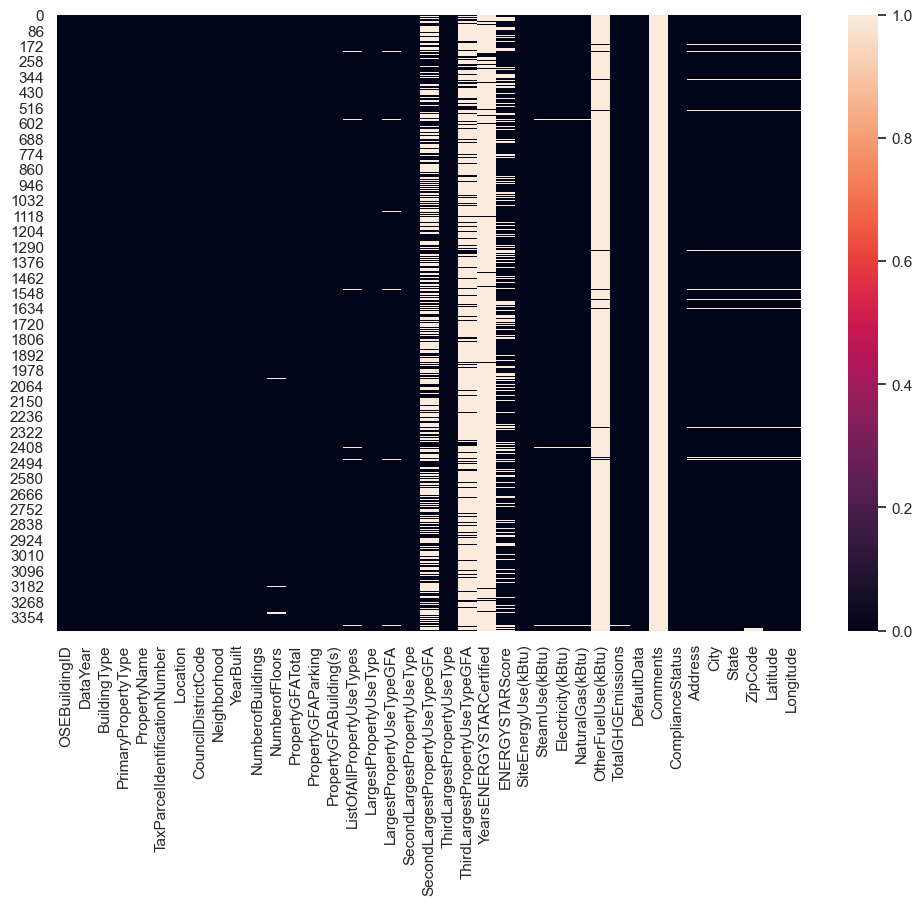

In [29]:
plt.figure(figsize=(12,8))
sns.heatmap(df.isna())
plt.show()

#### Après investigation ces varibales exites sous d'autres libebllés
    - Notre jeux de données a (3432, 39)
    - Nous avons prédéfini 6 catégories de variables : id, adress, quant, cat, obj et target
    - Les variables d'intérets sont qantitatives et plutôt assez bein remplies < 1% de n.a
    - la variable ENERGYSTARScore est rempli à 75% et est en plus un variable dérivée donc elle sera écartée de nos analyses
    - Les varibles avec plus de 50% de na sont des variables conditionnelles 

### Analyse Univariée

In [30]:
#Variables quantitatives
df[var_target+var_quant].describe()

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
count,3.428000e+03,3428.000000,3432.000000,3431.000000,3415.000000,3.432000e+03,3432.00000,3.432000e+03,3.402000e+03,1704.000000,607.000000
mean,5.419875e+06,119.774800,1968.360140,1.109298,4.682577,9.447183e+04,9650.32197,8.482151e+04,7.921153e+04,28497.813467,11660.911531
std,2.155893e+07,534.960144,33.182901,1.995769,5.218706,2.172062e+05,32953.70234,2.048835e+05,2.011318e+05,54202.216986,29021.209831
min,1.340900e+04,0.090000,1900.000000,1.000000,1.000000,1.128500e+04,0.00000,0.000000e+00,6.455000e+03,0.000000,0.000000
25%,9.334573e+05,9.583750,1948.000000,1.000000,2.000000,2.846350e+04,0.00000,2.726825e+04,2.505300e+04,5000.000000,2275.500000
50%,1.801407e+06,33.842500,1974.000000,1.000000,4.000000,4.419500e+04,0.00000,4.213725e+04,3.986750e+04,10725.500000,5000.000000
75%,4.221283e+06,91.890000,1997.000000,1.000000,5.000000,9.044875e+04,2890.25000,8.192375e+04,7.557300e+04,26797.250000,10182.500000
max,8.739237e+08,16870.980000,2015.000000,111.000000,76.000000,9.320156e+06,512608.00000,9.320156e+06,9.320156e+06,686750.000000,459748.000000


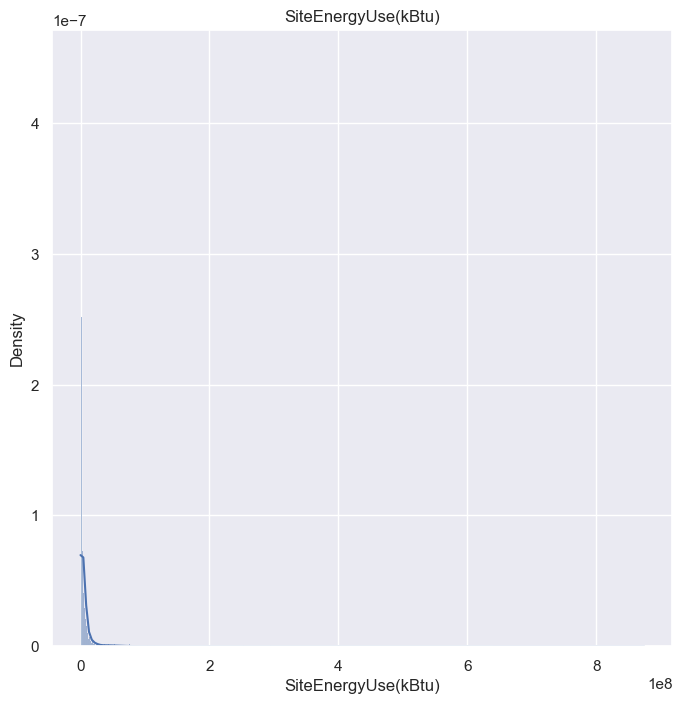

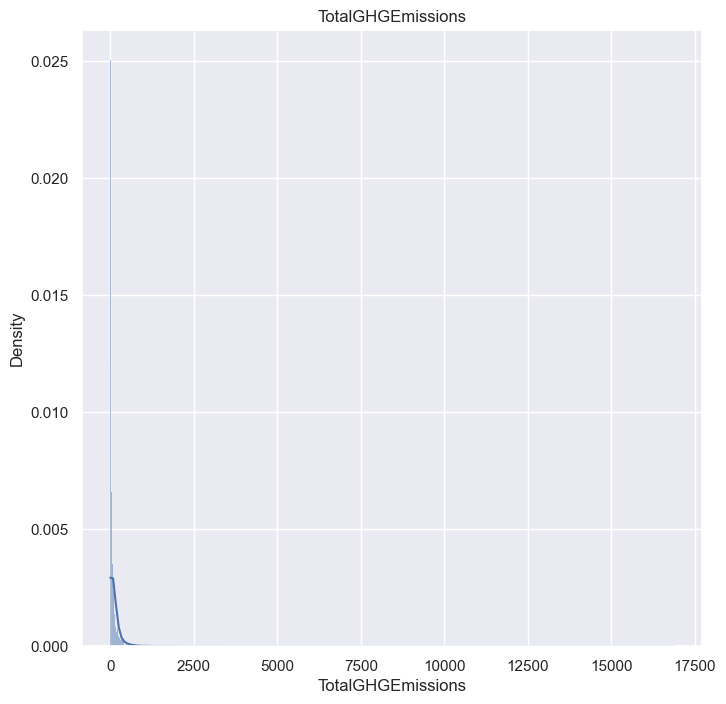

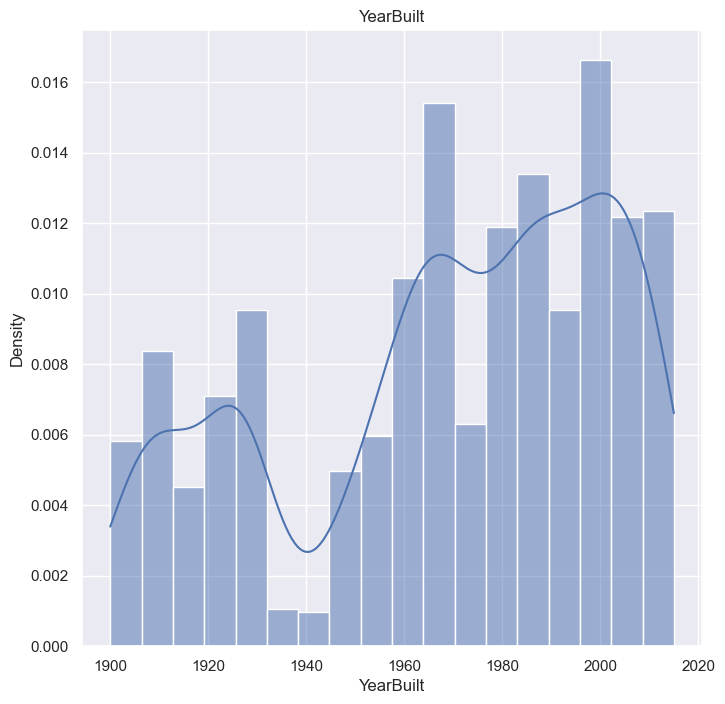

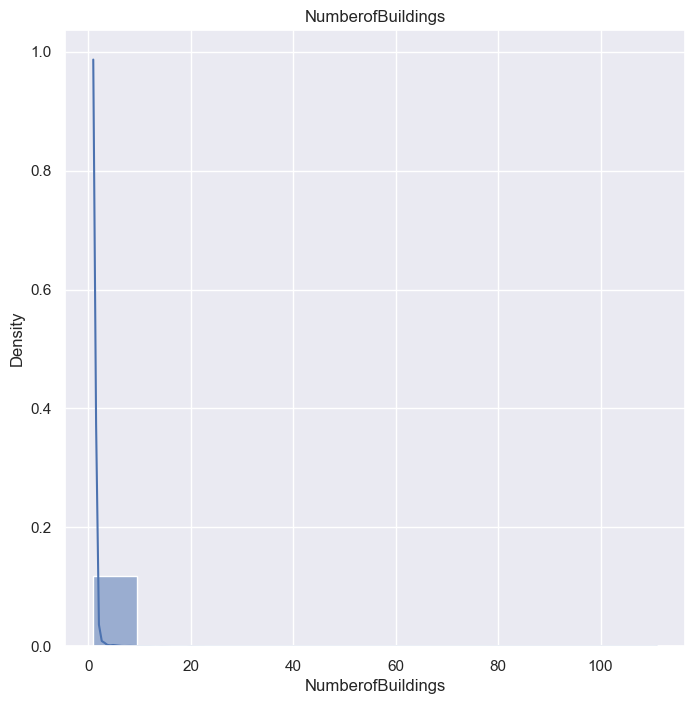

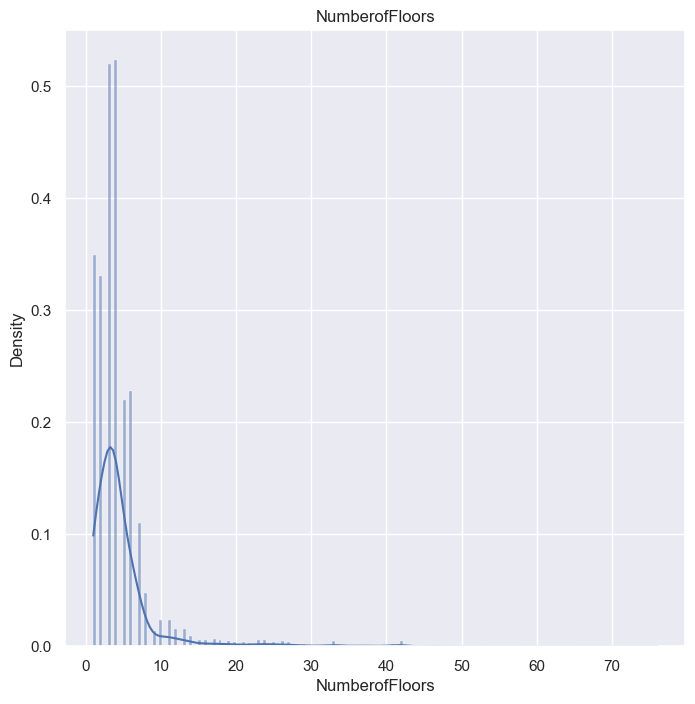

...

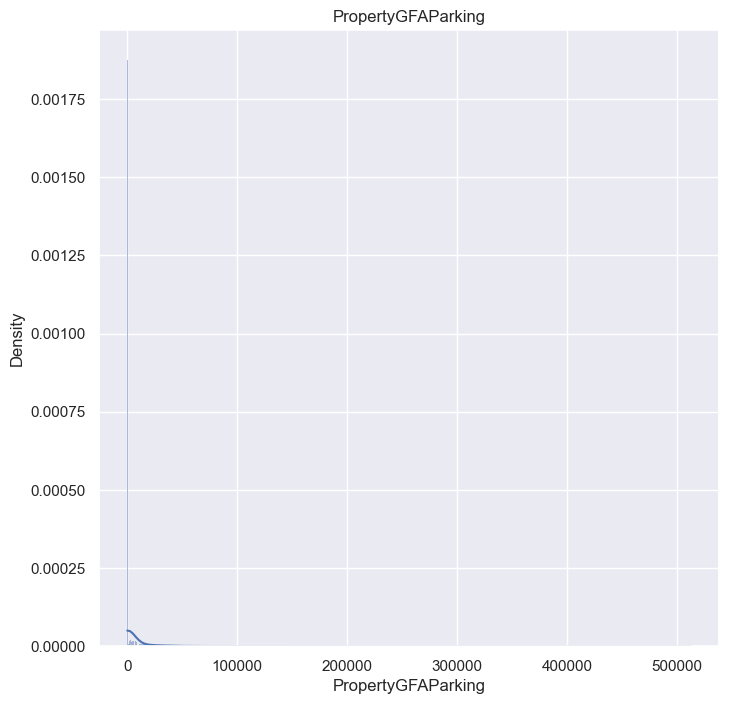

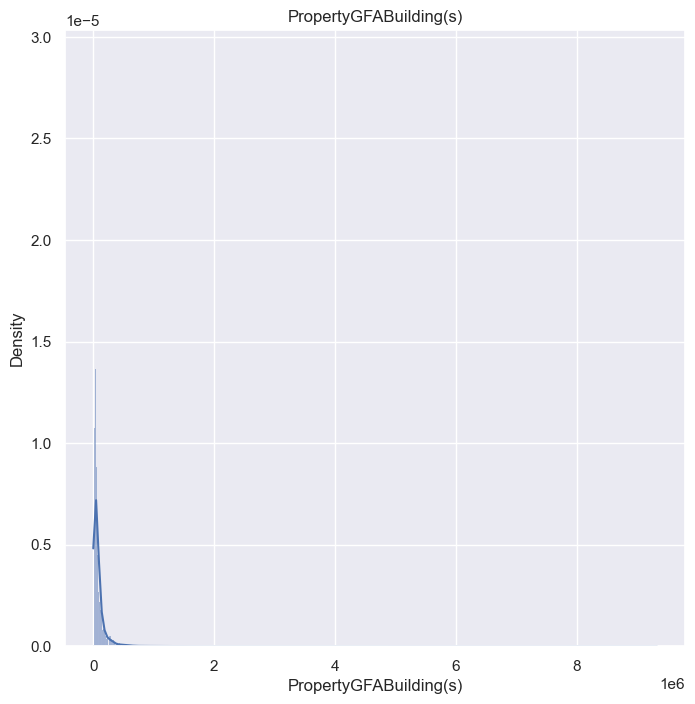

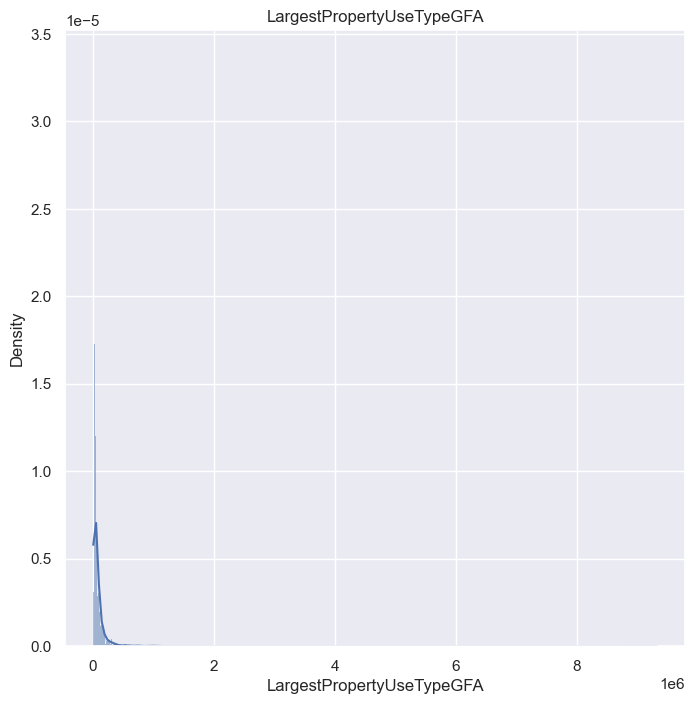

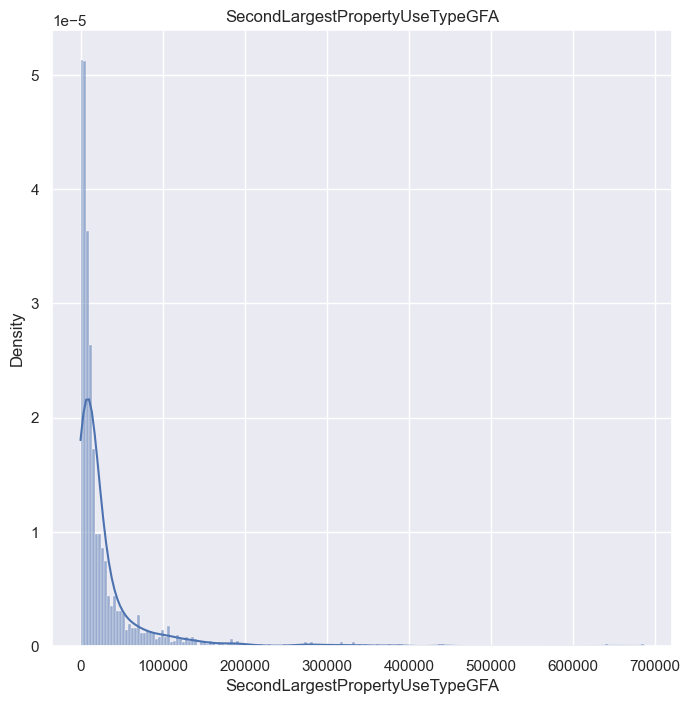

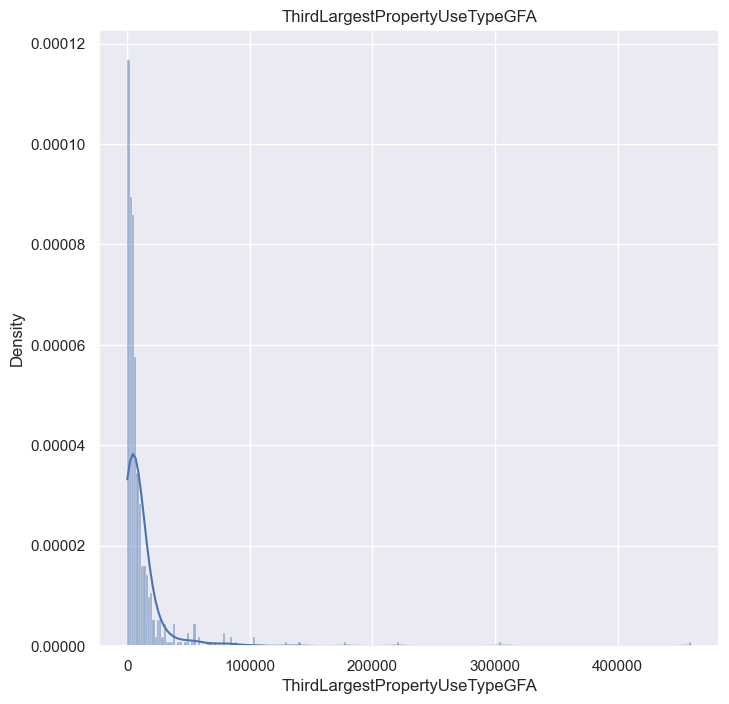

In [31]:
for col in var_target+var_quant:
    plt.figure(figsize = (8, 8))
    plt.title( col )
    sns.histplot(df[col], stat='density', kde=True)
    plt.show()

#### Notes: Les distributions des variables quantit sont assez étendues vers la droite, on va les log pour les regarder de plus près

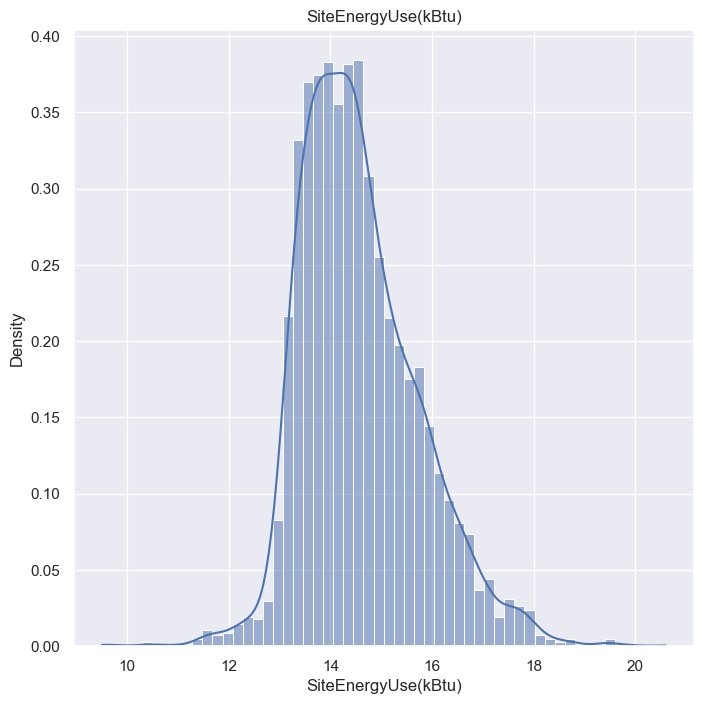

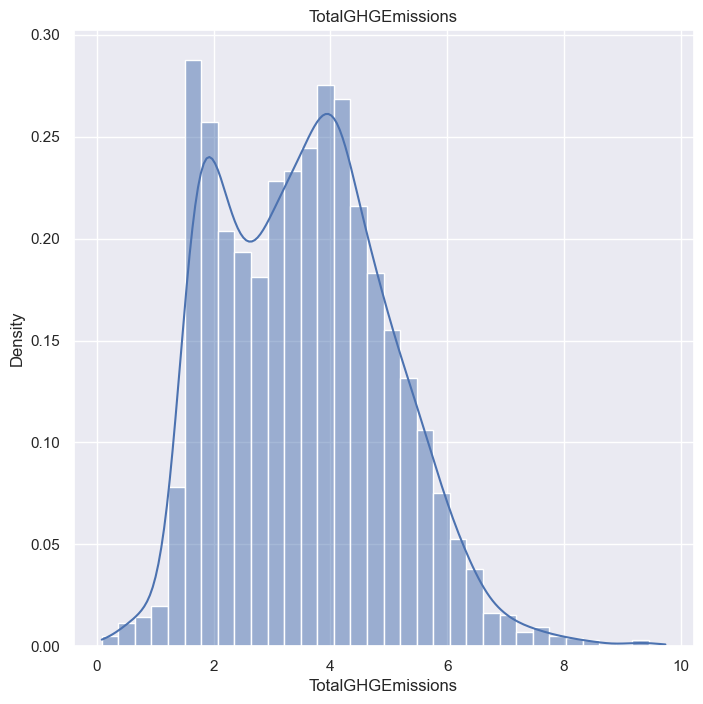

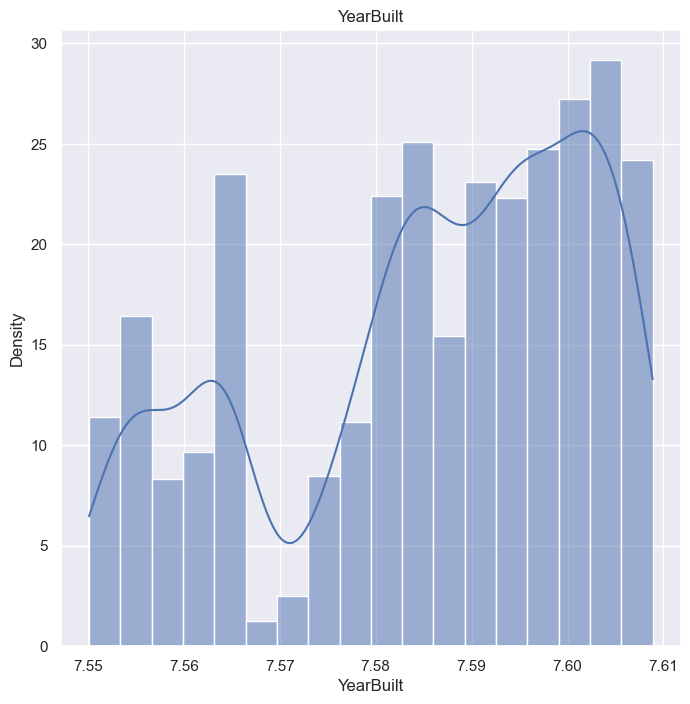

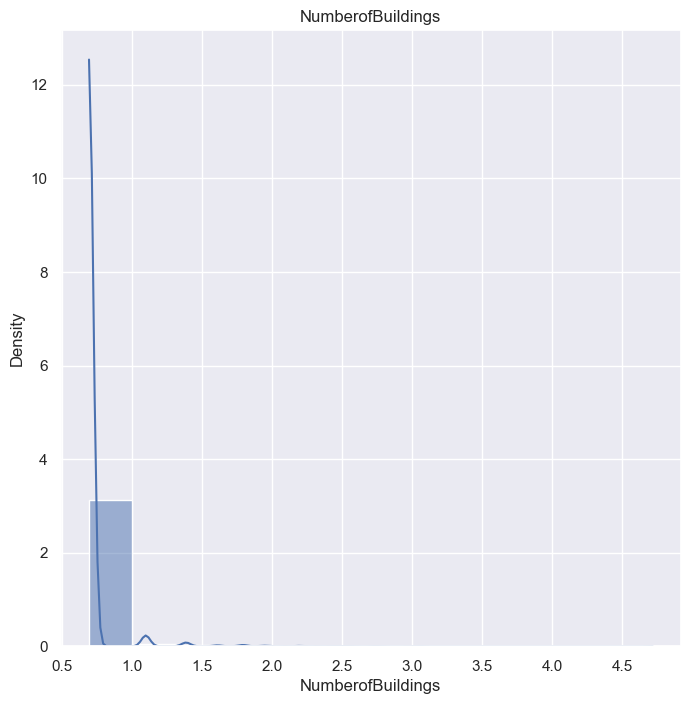

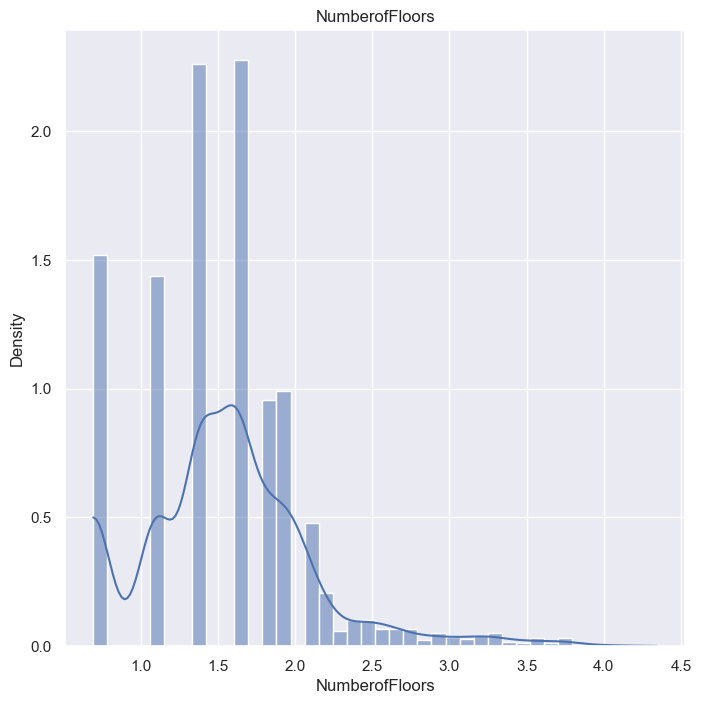

...

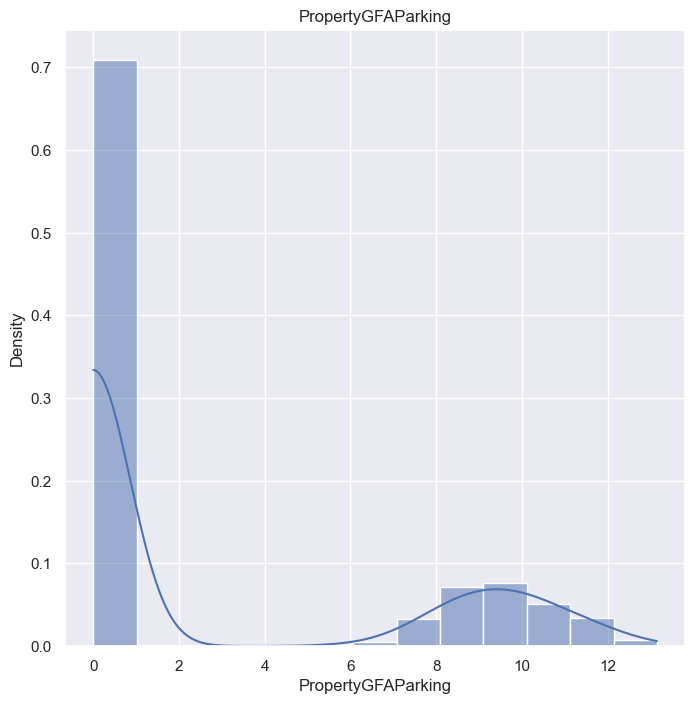

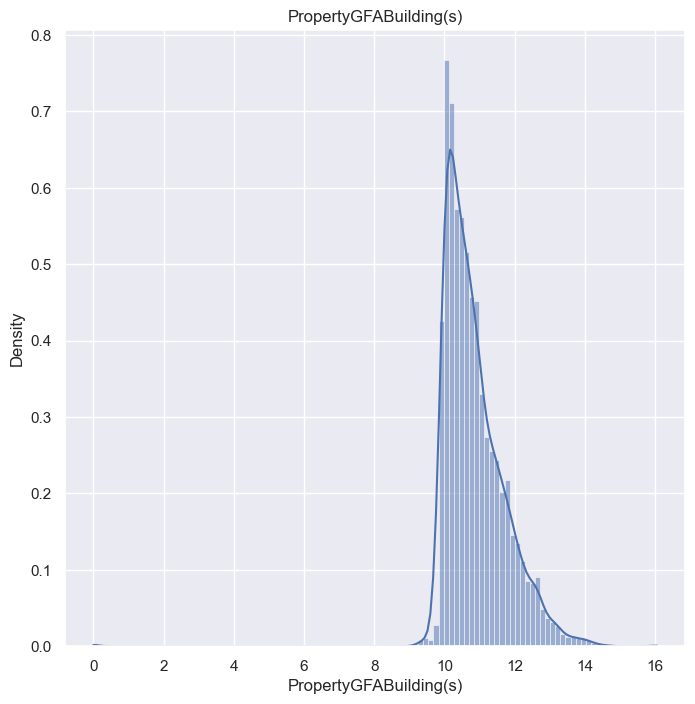

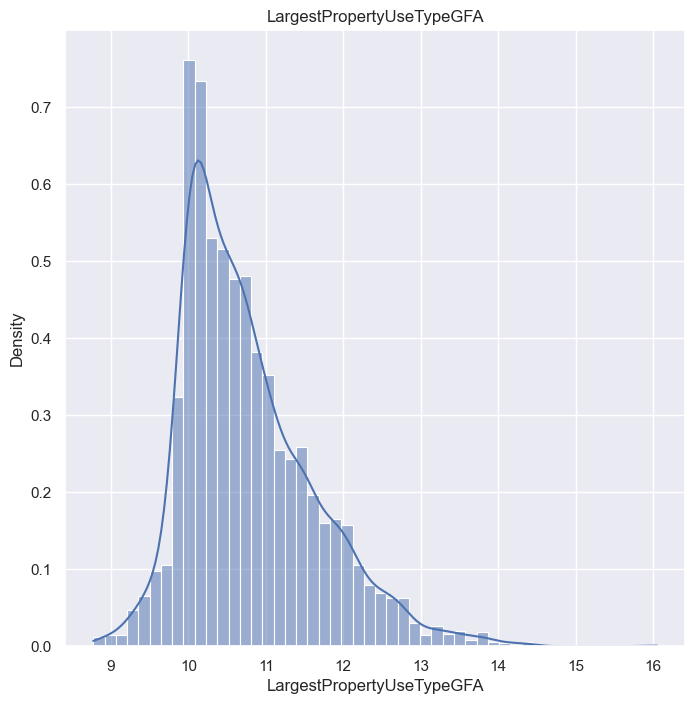

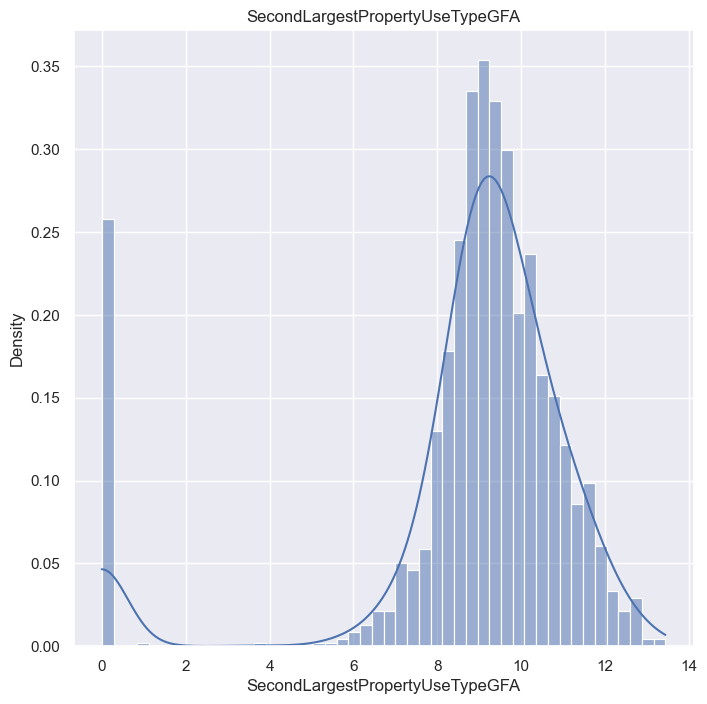

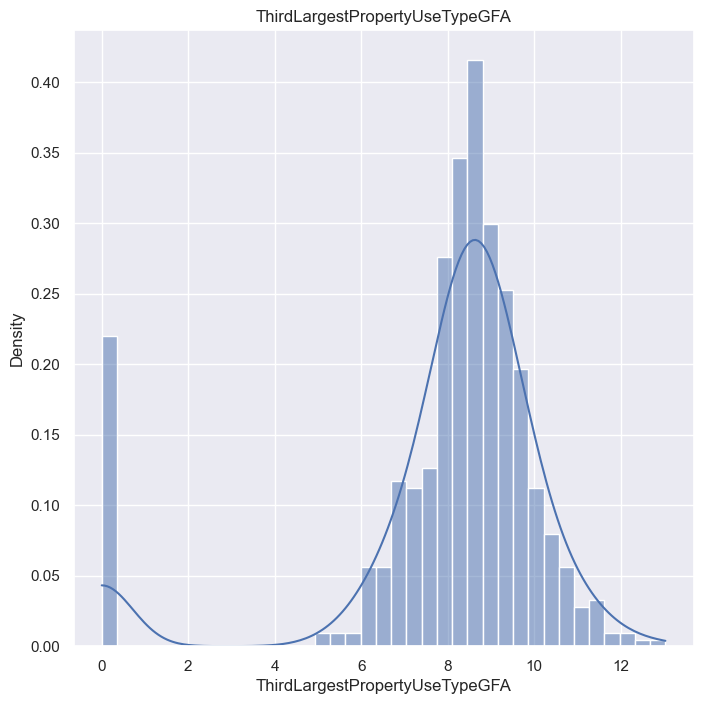

In [32]:
for col in var_target+var_quant:
    plt.figure(figsize = (8, 8))
    plt.title( col )
    sns.histplot(np.log(df[col]+1), stat='density', kde=True)
    plt.show()

#### Notes: Le faite de log donne a la plupart des distribution une forme proche de celle de la loi de normale. 

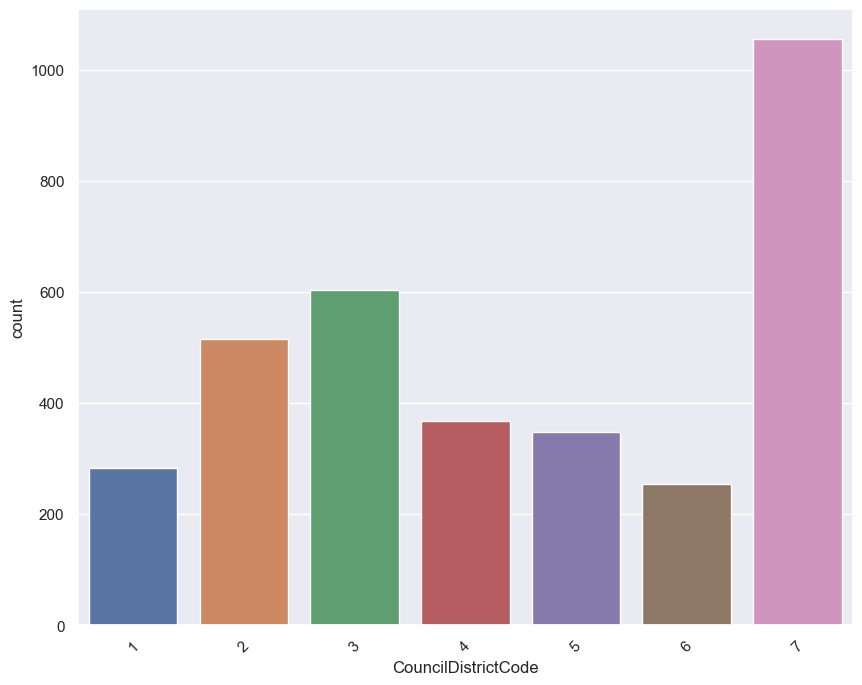

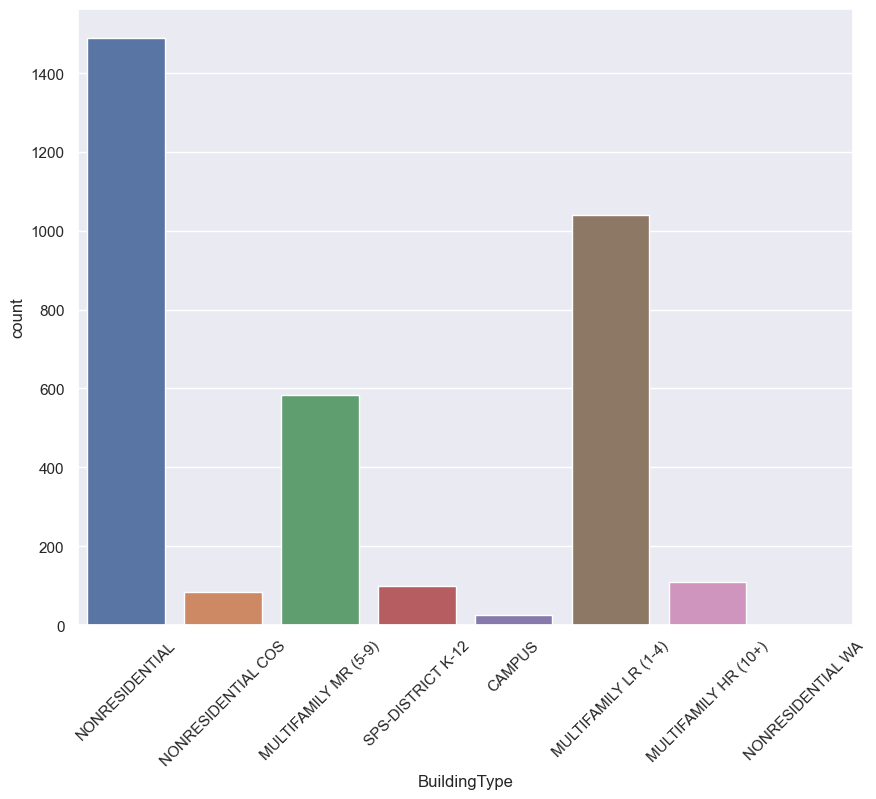

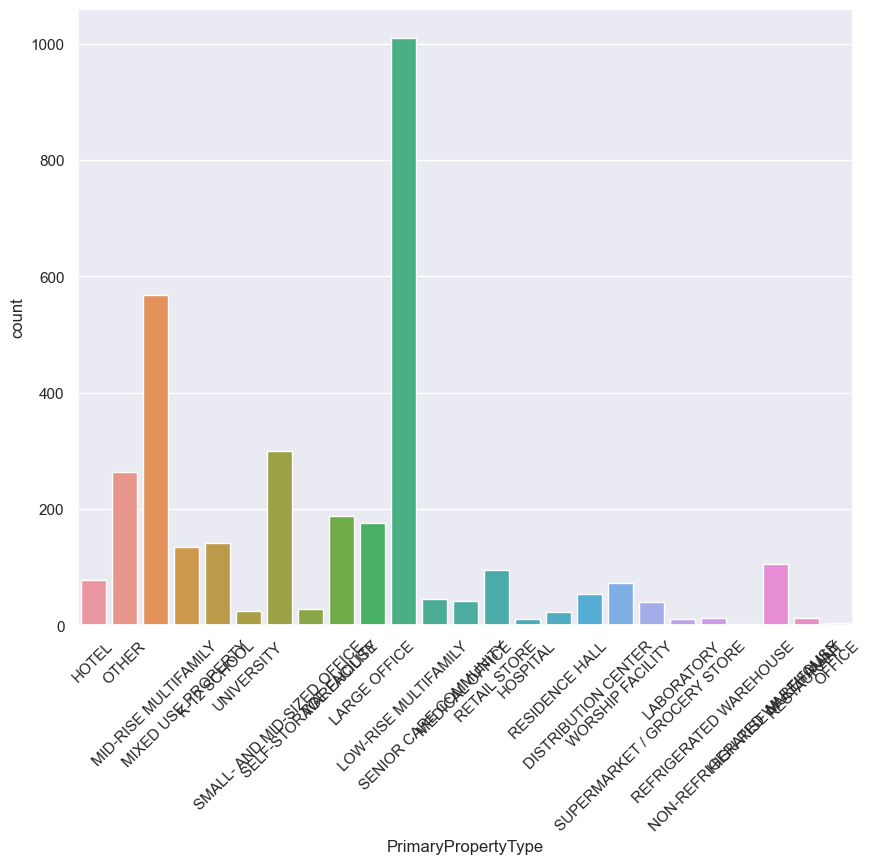

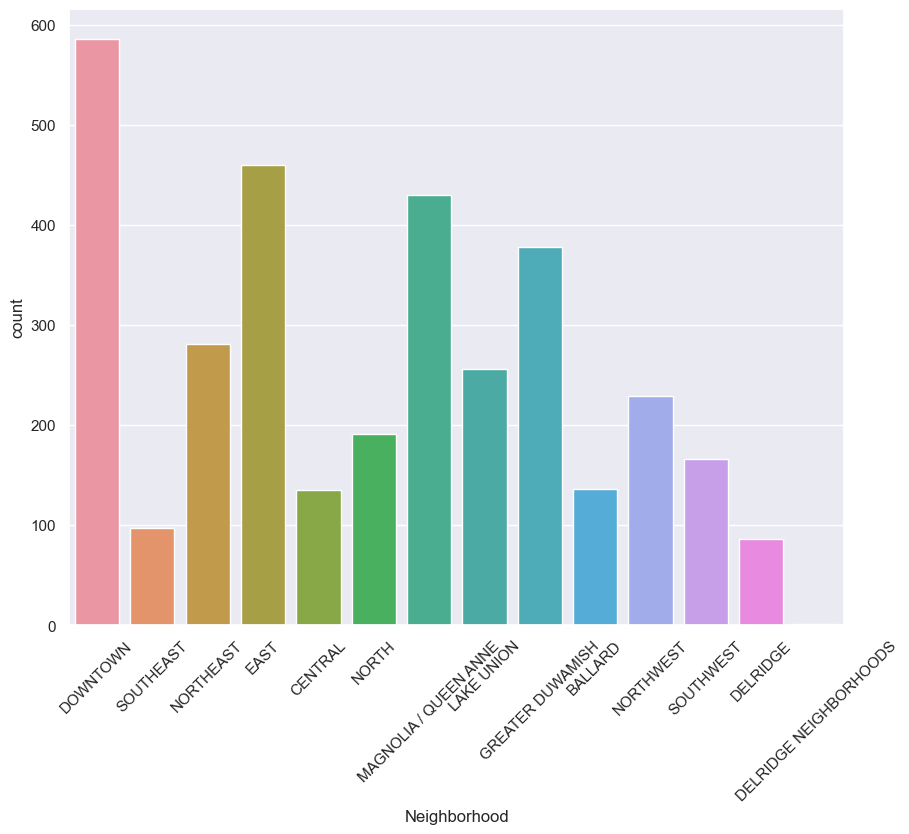

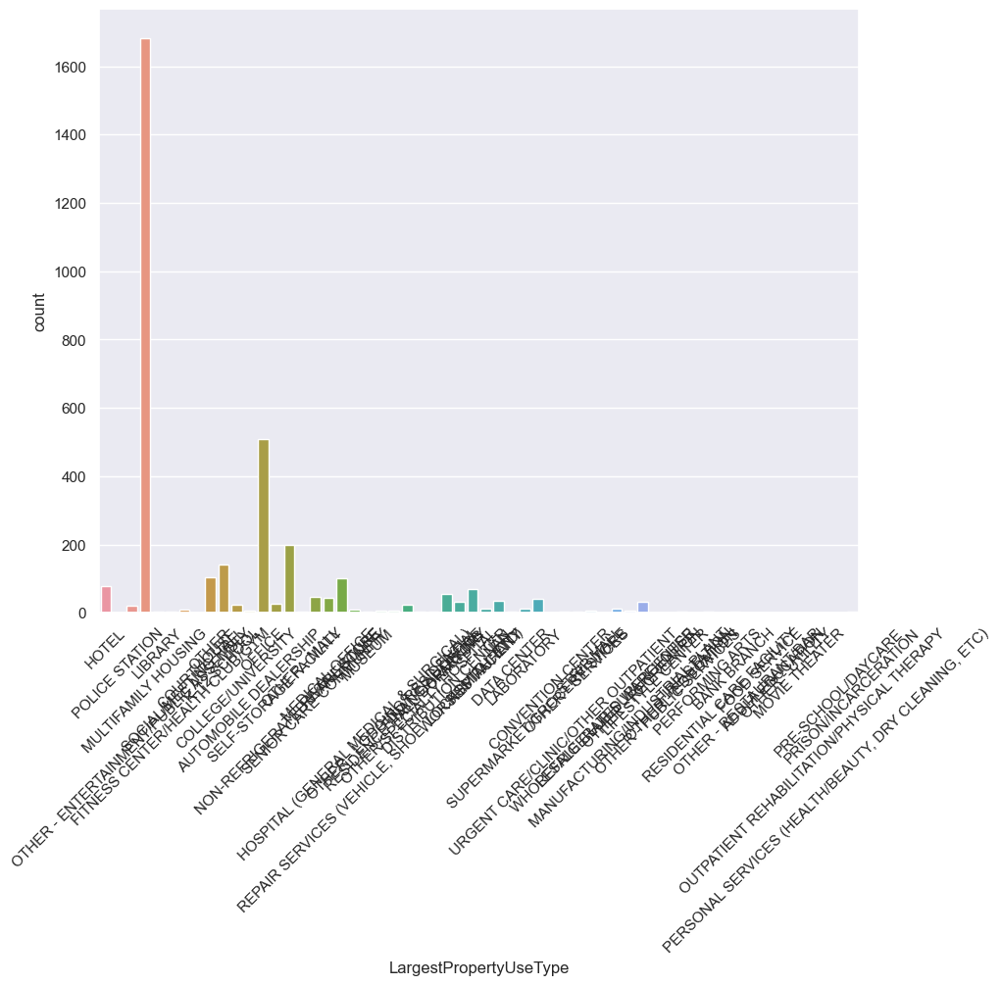

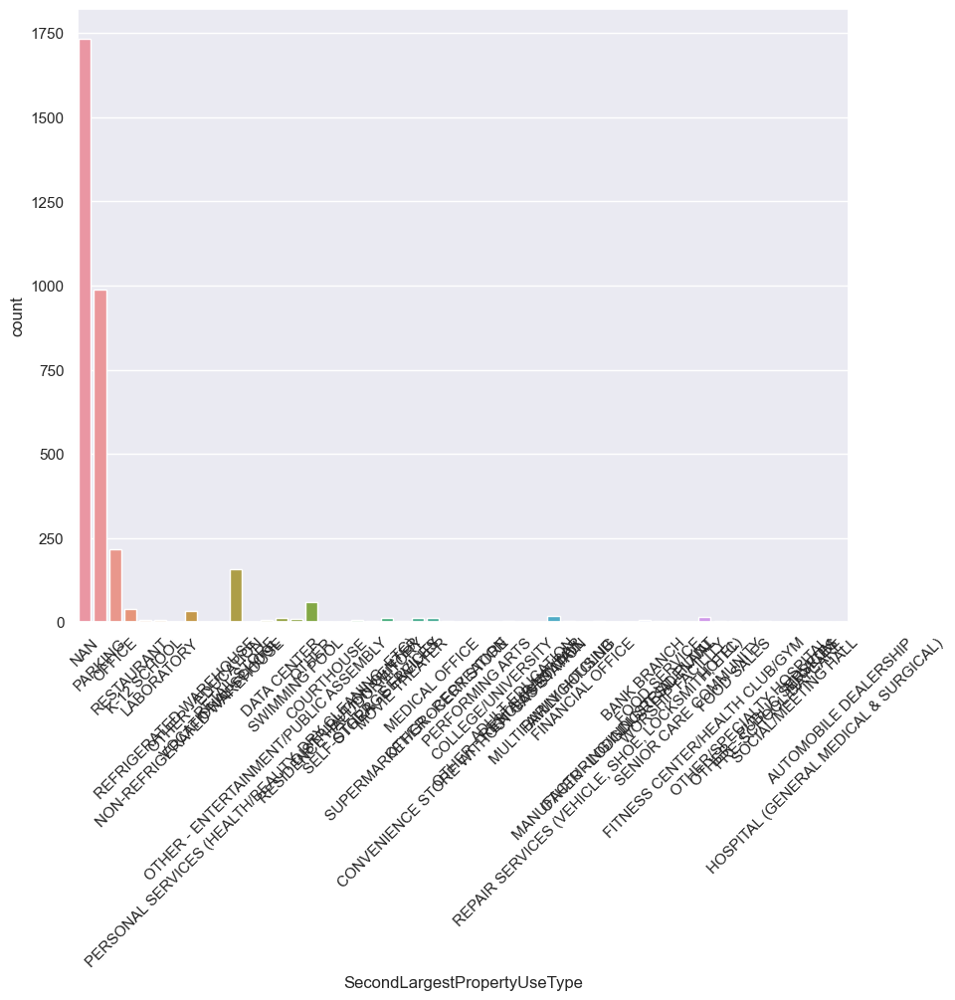

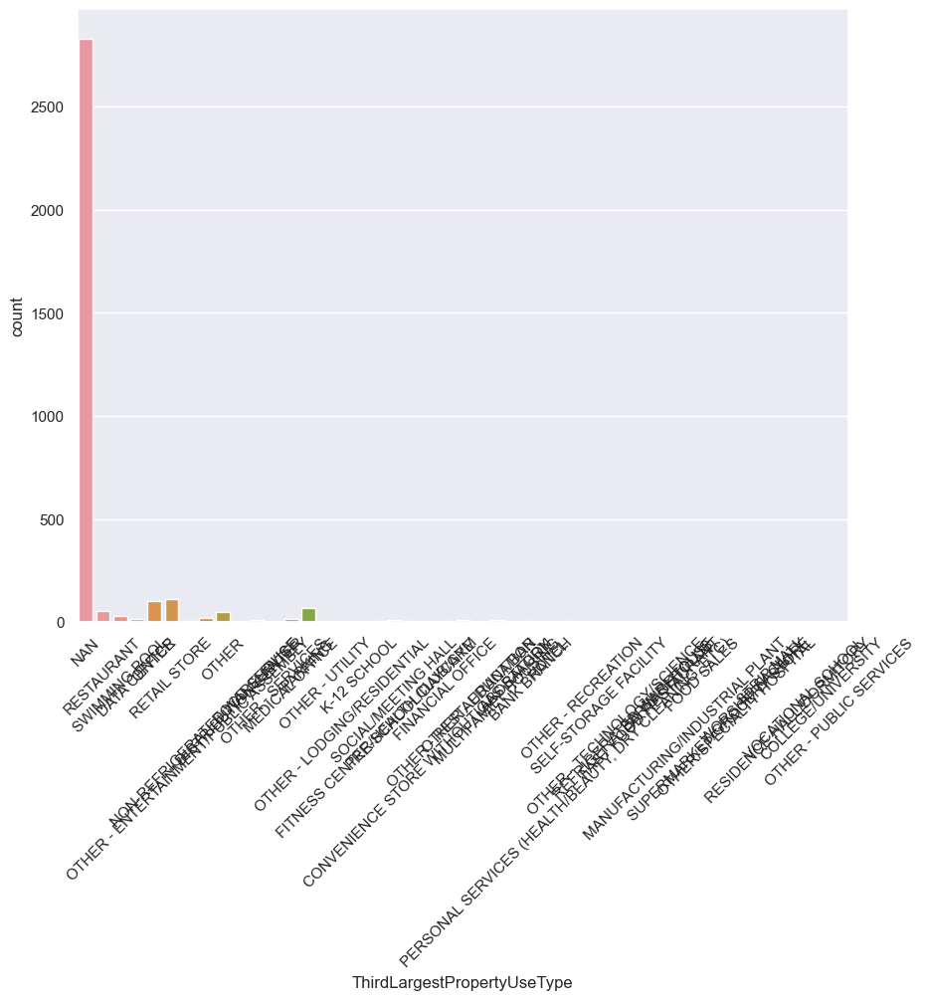

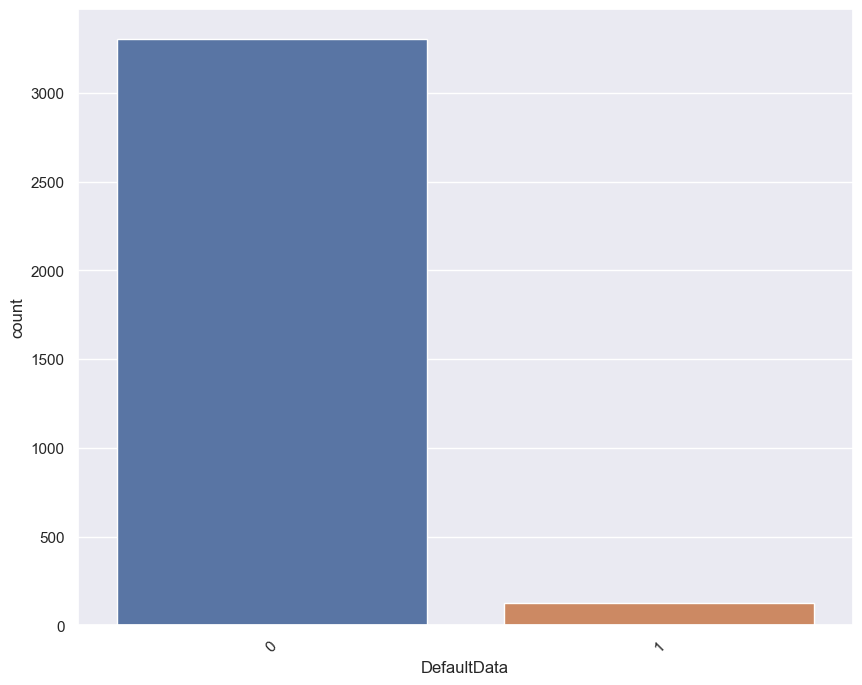

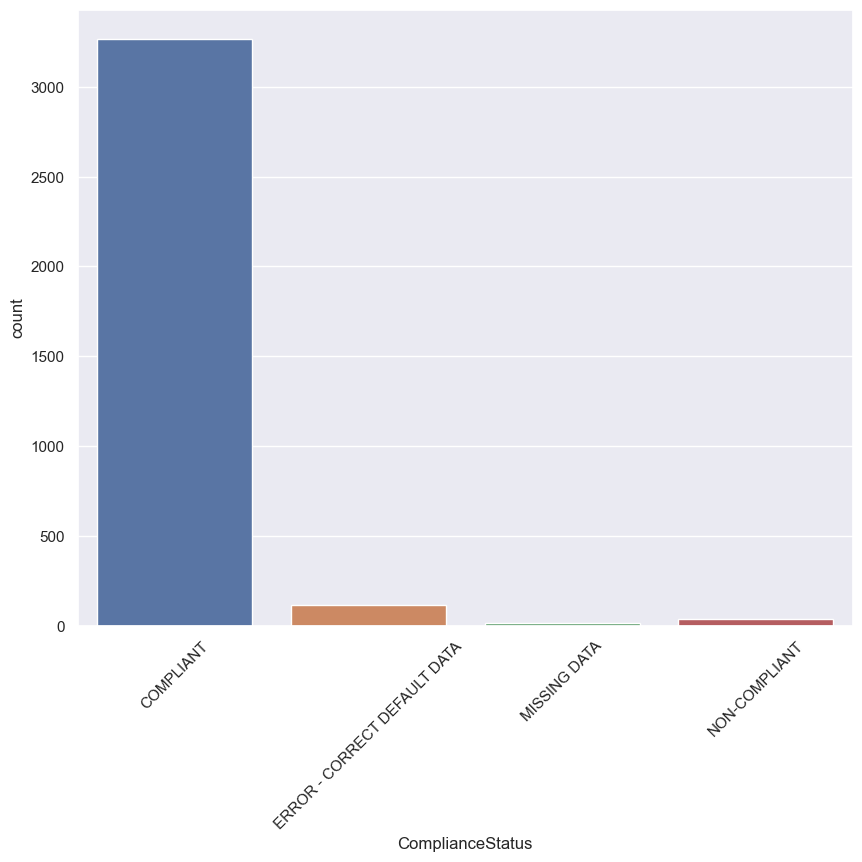

In [33]:
#variables cat
for col in var_cat:
    plt.figure(figsize=(10,8))
    sns.countplot(data= df, x=col)
    plt.xticks(rotation=45)
    plt.show()

In [34]:
### Globalement il y a bcp de modalités rares, des regroupemnt seront à faire

In [35]:
for col in var_cat:
    one = df[col].value_counts(normalize=True).sort_values(ascending=False)*100
    two = one.cumsum()
    print(
    pd.concat([one, two], axis=1), '\n'
    )

   CouncilDistrictCode  CouncilDistrictCode
7            30.798368            30.798368
3            17.628205            48.426573
2            15.034965            63.461538
4            10.722611            74.184149
5            10.139860            84.324009
1             8.275058            92.599068
6             7.400932           100.000000 

                      BuildingType  BuildingType
NONRESIDENTIAL           43.356643     43.356643
MULTIFAMILY LR (1-4)     30.303030     73.659674
MULTIFAMILY MR (5-9)     17.016317     90.675991
MULTIFAMILY HR (10+)      3.205128     93.881119
SPS-DISTRICT K-12         2.884615     96.765734
NONRESIDENTIAL COS        2.476690     99.242424
CAMPUS                    0.728438     99.970862
NONRESIDENTIAL WA         0.029138    100.000000 

                             PrimaryPropertyType  PrimaryPropertyType
LOW-RISE MULTIFAMILY                   29.399767            29.399767
MID-RISE MULTIFAMILY                   16.550117            45.

### Notes : certaines catégories peuvent être regroupées sous la modalité "autre".

### Analyse Bivariée

<Figure size 640x480 with 0 Axes>

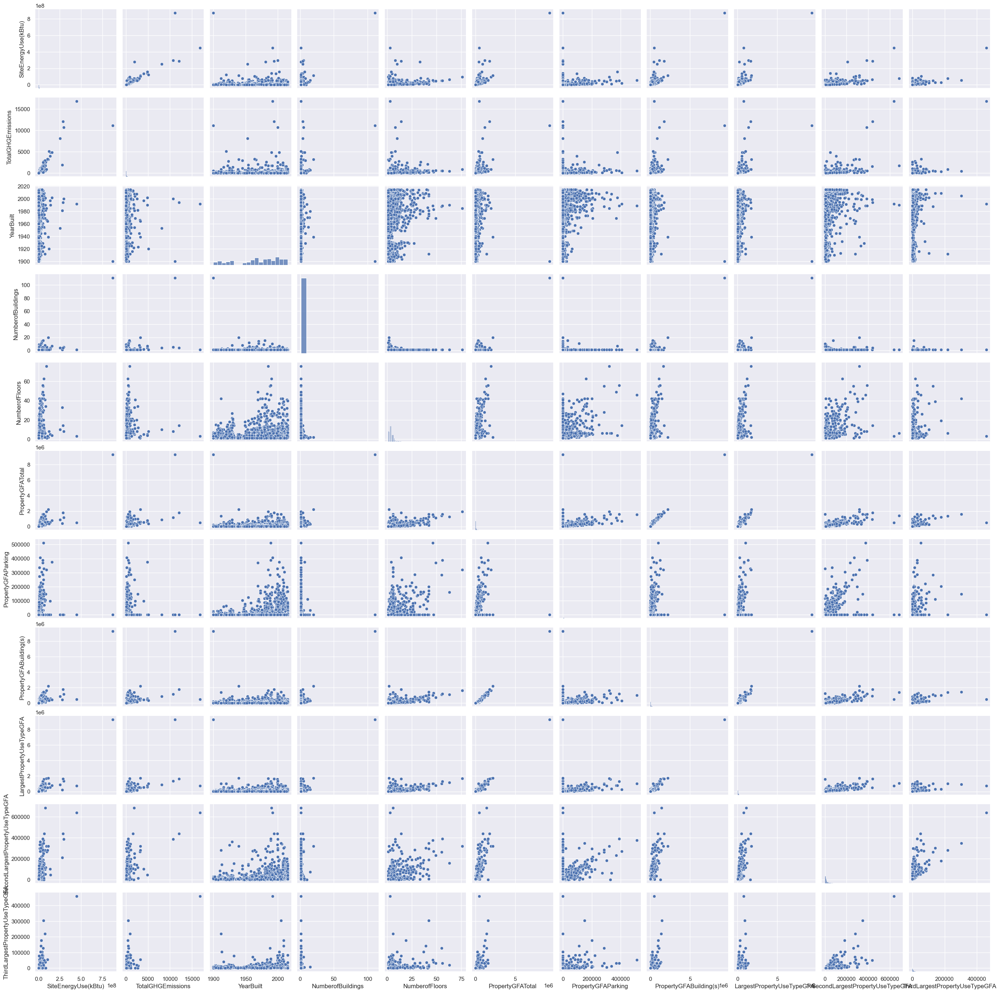

In [36]:
# Variable quant
plt.figure()
sns.pairplot(df[var_target+var_quant])
plt.show()

<Figure size 640x480 with 0 Axes>

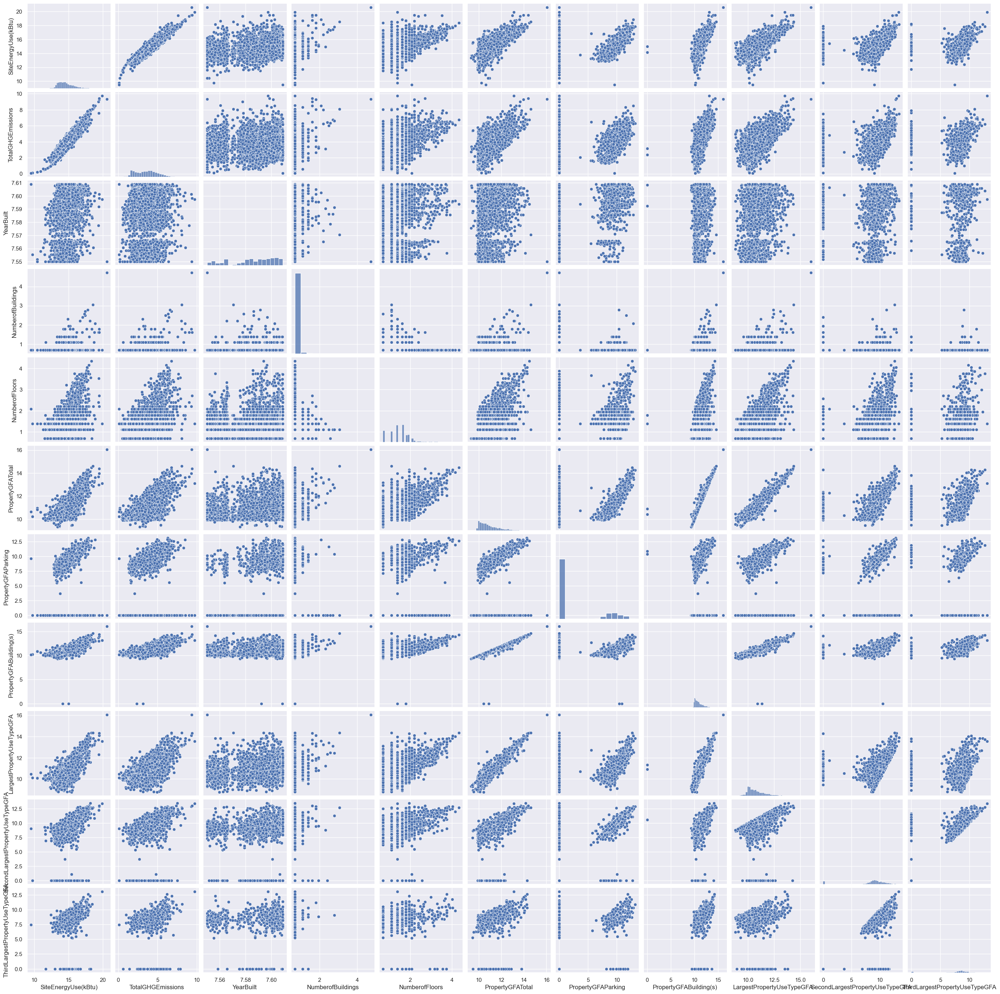

In [37]:
# Variable quant log
plt.figure()
sns.pairplot(np.log(df[var_target+var_quant]+1))
plt.show()

In [38]:
df[var_target+var_quant].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3432 entries, 0 to 3431
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   SiteEnergyUse(kBtu)              3428 non-null   float64
 1   TotalGHGEmissions                3428 non-null   float64
 2   YearBuilt                        3432 non-null   int64  
 3   NumberofBuildings                3431 non-null   float64
 4   NumberofFloors                   3415 non-null   float64
 5   PropertyGFATotal                 3432 non-null   float64
 6   PropertyGFAParking               3432 non-null   float64
 7   PropertyGFABuilding(s)           3432 non-null   float64
 8   LargestPropertyUseTypeGFA        3402 non-null   float64
 9   SecondLargestPropertyUseTypeGFA  1704 non-null   float64
 10  ThirdLargestPropertyUseTypeGFA   607 non-null    float64
dtypes: float64(10), int64(1)
memory usage: 295.1 KB


<Figure size 640x480 with 0 Axes>

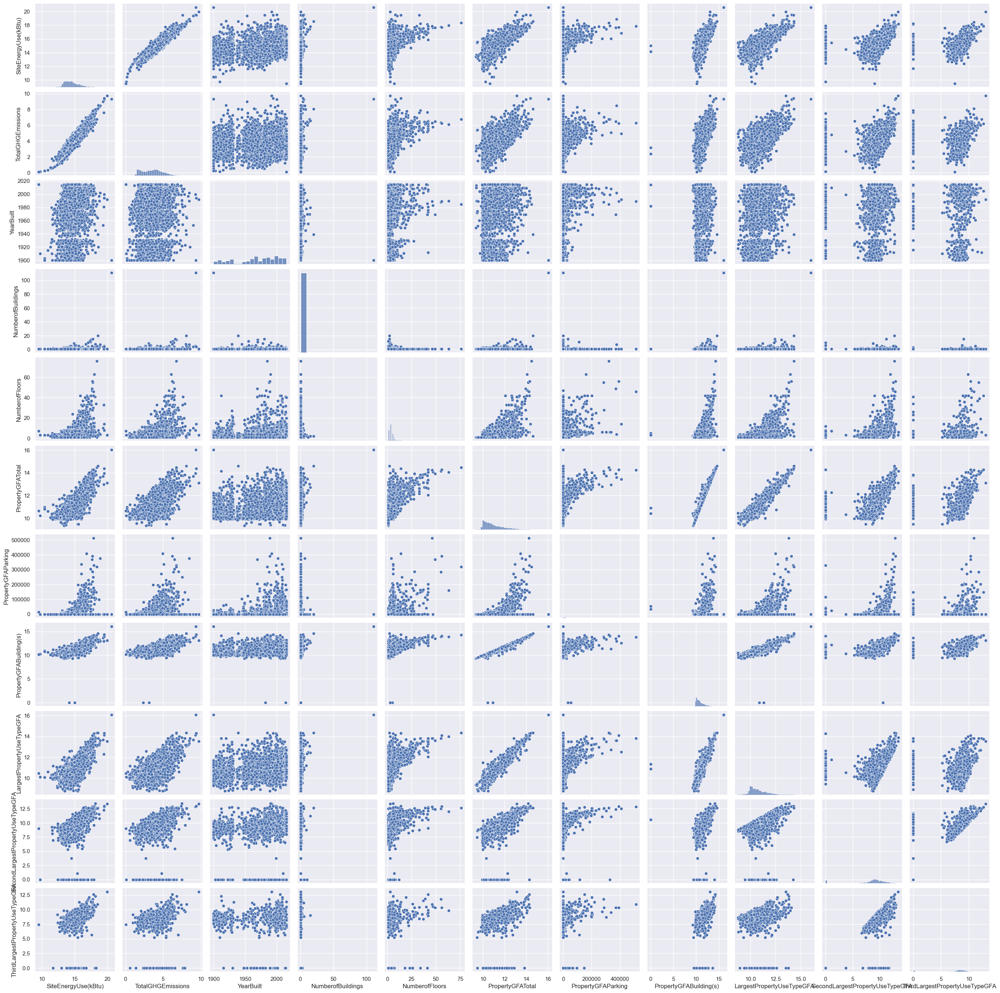

In [54]:
# Variable quant log sauf target
df_prime = df.loc[:,var_target+var_quant]
df_prime.iloc[:,[0,1,5,7,8,9,10]]= np.log(df_prime.iloc[:,[0,1,5,7,8,9,10]]+1)
plt.figure()
sns.pairplot(df_prime)
plt.show()

<Figure size 640x480 with 0 Axes>

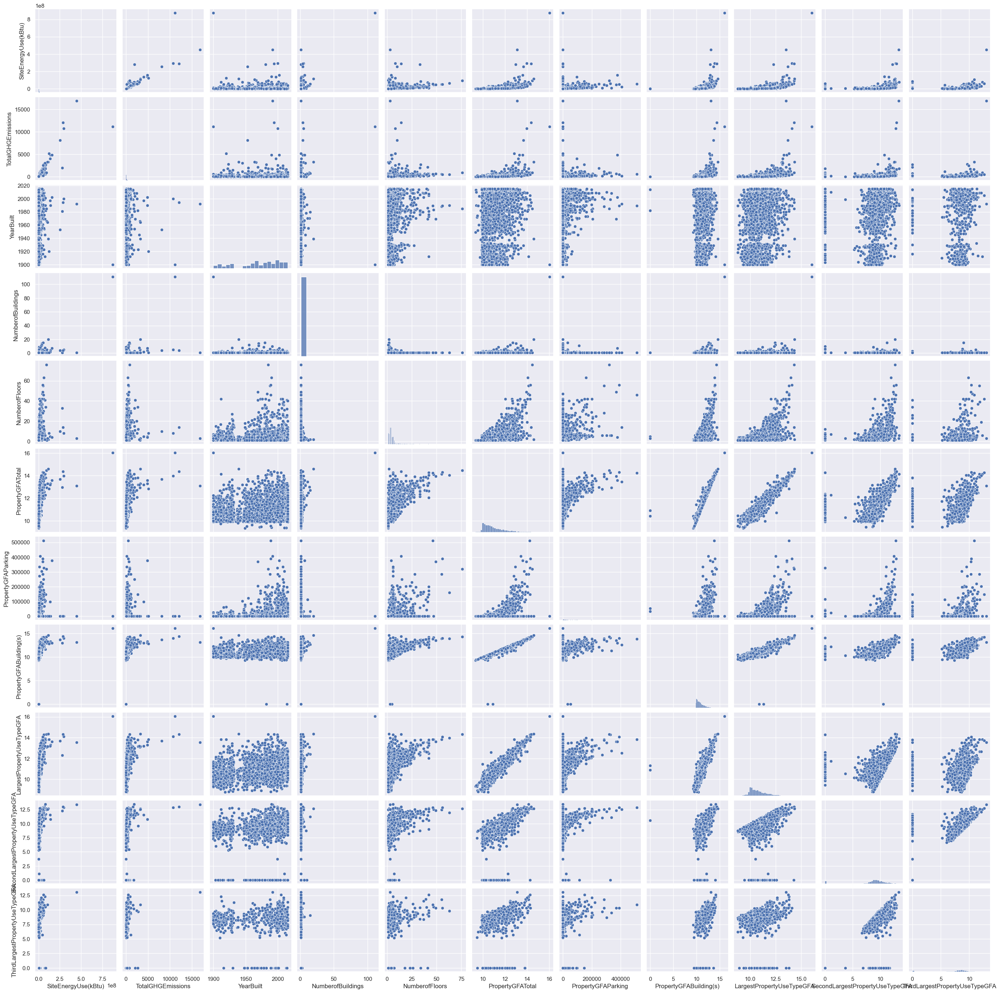

In [40]:
# log features certains quant sauf target
df_prime = df.loc[:,var_target+var_quant]
df_prime.iloc[:,[5,7,8,9,10]]= np.log(df_prime.iloc[:,[5,7,8,9,10]]+1)
plt.figure()
sns.pairplot(df_prime)
plt.show()

<Figure size 640x480 with 0 Axes>

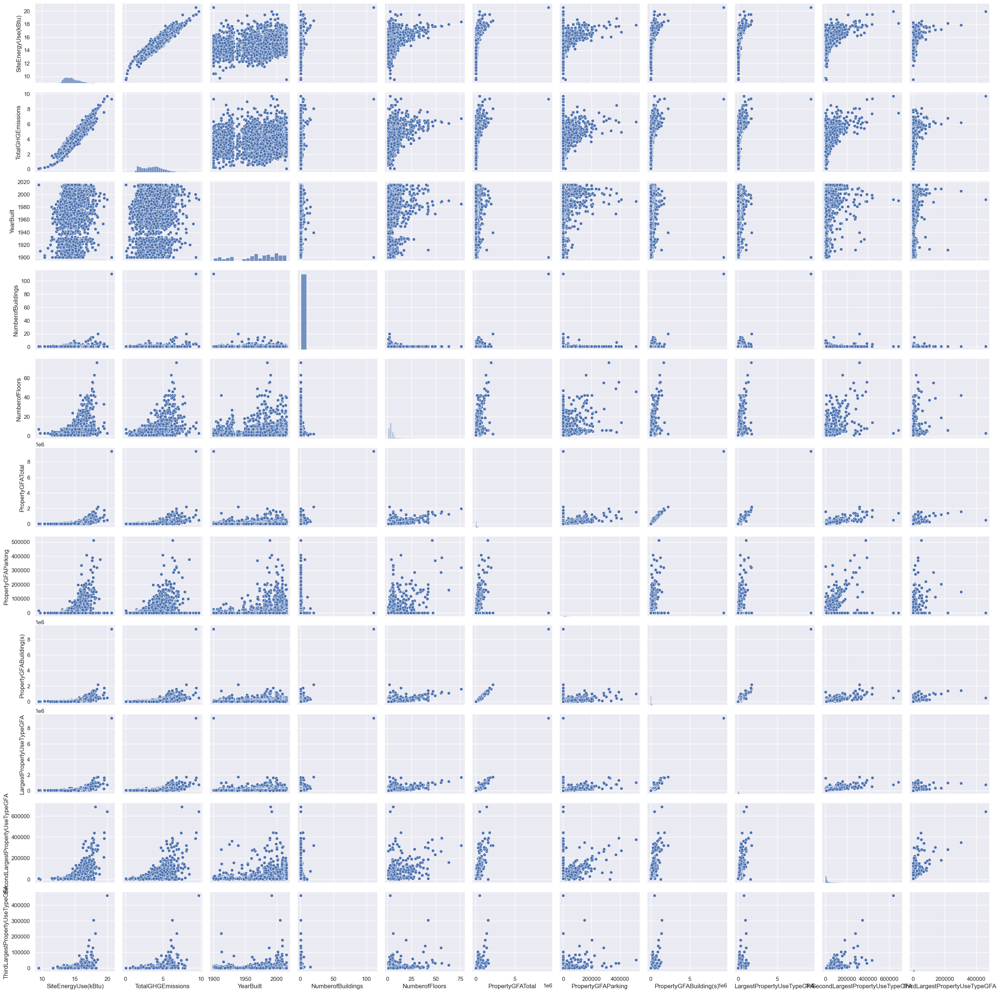

In [41]:
# Log target sauf quant
df_prime = df.loc[:,var_target+var_quant]
df_prime.loc[:,var_target]= np.log(df_prime.loc[:,var_target]+1)
plt.figure()
sns.pairplot(df_prime)
plt.show()

### Notes : Pas de nuage de points au format curviligne ou assez particuliers que les correlations linéaires ne puissent pas traduire en terme de relation

In [59]:
# sans log
# Correlation supérieurs à 0.7
df[var_target+var_quant].corr()

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
SiteEnergyUse(kBtu),1.000000,0.865047,0.032355,0.710539,0.318654,0.804967,0.203945,0.820575,0.840094,0.658965,0.745246
TotalGHGEmissions,0.865047,1.000000,0.018739,0.406029,0.164494,0.543403,0.125822,0.555846,0.586773,0.531853,0.667369
YearBuilt,0.032355,0.018739,1.000000,-0.028371,0.154034,0.102375,0.225385,0.072282,0.071889,0.196444,0.092395
NumberofBuildings,0.710539,0.406029,-0.028371,1.000000,-0.033705,0.740707,0.004734,0.784493,0.799587,0.155826,0.016631
NumberofFloors,0.318654,0.164494,0.154034,-0.033705,1.000000,0.641034,0.469324,0.614854,0.610857,0.495222,0.228056
PropertyGFATotal,0.804967,0.543403,0.102375,0.740707,0.641034,1.000000,0.439189,0.989505,0.974584,0.806651,0.514046
PropertyGFAParking,0.203945,0.125822,0.225385,0.004734,0.469324,0.439189,1.000000,0.304762,0.332527,0.532423,0.276031
PropertyGFABuilding(s),0.820575,0.555846,0.072282,0.784493,0.614854,0.989505,0.304762,1.000000,0.979693,0.790250,0.526928
LargestPropertyUseTypeGFA,0.840094,0.586773,0.071889,0.799587,0.610857,0.974584,0.332527,0.979693,1.000000,0.772363,0.446580
SecondLargestPropertyUseTypeGFA,0.658965,0.531853,0.196444,0.155826,0.495222,0.806651,0.532423,0.790250,0.772363,1.000000,0.660403


In [61]:
# sans log
# Correlation supérieurs à 0.5
df[var_target+var_quant].corr()[df[var_target+var_quant].corr() >= 0.5]

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
SiteEnergyUse(kBtu),1.000000,0.865047,NaN,0.710539,NaN,0.804967,NaN,0.820575,0.840094,0.658965,0.745246
TotalGHGEmissions,0.865047,1.000000,NaN,NaN,NaN,0.543403,NaN,0.555846,0.586773,0.531853,0.667369
YearBuilt,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofBuildings,0.710539,NaN,NaN,1.000000,NaN,0.740707,NaN,0.784493,0.799587,NaN,NaN
NumberofFloors,NaN,NaN,NaN,NaN,1.000000,0.641034,NaN,0.614854,0.610857,NaN,NaN
PropertyGFATotal,0.804967,0.543403,NaN,0.740707,0.641034,1.000000,NaN,0.989505,0.974584,0.806651,0.514046
PropertyGFAParking,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.532423,NaN
PropertyGFABuilding(s),0.820575,0.555846,NaN,0.784493,0.614854,0.989505,NaN,1.000000,0.979693,0.790250,0.526928
LargestPropertyUseTypeGFA,0.840094,0.586773,NaN,0.799587,0.610857,0.974584,NaN,0.979693,1.000000,0.772363,NaN
SecondLargestPropertyUseTypeGFA,0.658965,0.531853,NaN,NaN,NaN,0.806651,0.532423,0.790250,0.772363,1.000000,0.660403


In [63]:
#All log
# Correlation supérieurs à 0.5
df_prime = np.log(df.loc[:,var_target+var_quant]+1)
df_prime.corr()[df_prime.corr() >=0.5]

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
SiteEnergyUse(kBtu),1.000000,0.892189,NaN,NaN,NaN,0.800204,NaN,0.755936,0.770527,NaN,NaN
TotalGHGEmissions,0.892189,1.000000,NaN,NaN,NaN,0.644730,NaN,0.624152,0.626302,NaN,NaN
YearBuilt,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofBuildings,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofFloors,NaN,NaN,NaN,NaN,1.000000,0.544174,NaN,0.502720,0.522447,NaN,NaN
PropertyGFATotal,0.800204,0.644730,NaN,NaN,0.544174,1.000000,NaN,0.940707,0.948225,NaN,NaN
PropertyGFAParking,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
PropertyGFABuilding(s),0.755936,0.624152,NaN,NaN,0.502720,0.940707,NaN,1.000000,0.901594,NaN,NaN
LargestPropertyUseTypeGFA,0.770527,0.626302,NaN,NaN,0.522447,0.948225,NaN,0.901594,1.000000,NaN,NaN
SecondLargestPropertyUseTypeGFA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


In [58]:
#Certains log
df_prime = df.loc[:,var_target+var_quant]
df_prime.iloc[:,[0,1,5,7,8,9,10]]= np.log(df_prime.iloc[:,[0,1,5,7,8,9,10]]+1)
df_prime.corr()[df_prime.corr() >=0.5]

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
SiteEnergyUse(kBtu),1.000000,0.892189,NaN,NaN,NaN,0.800204,NaN,0.755936,0.770527,NaN,NaN
TotalGHGEmissions,0.892189,1.000000,NaN,NaN,NaN,0.644730,NaN,0.624152,0.626302,NaN,NaN
YearBuilt,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofBuildings,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofFloors,NaN,NaN,NaN,NaN,1.000000,0.556401,NaN,0.528833,0.544566,NaN,NaN
PropertyGFATotal,0.800204,0.644730,NaN,NaN,0.556401,1.000000,0.536973,0.940707,0.948225,NaN,NaN
PropertyGFAParking,NaN,NaN,NaN,NaN,NaN,0.536973,1.000000,NaN,NaN,NaN,NaN
PropertyGFABuilding(s),0.755936,0.624152,NaN,NaN,0.528833,0.940707,NaN,1.000000,0.901594,NaN,NaN
LargestPropertyUseTypeGFA,0.770527,0.626302,NaN,NaN,0.544566,0.948225,NaN,0.901594,1.000000,NaN,NaN
SecondLargestPropertyUseTypeGFA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


In [64]:
df_prime.corr()[['SiteEnergyUse(kBtu)','TotalGHGEmissions']]

,SiteEnergyUse(kBtu),TotalGHGEmissions
SiteEnergyUse(kBtu),1.000000,0.892189
TotalGHGEmissions,0.892189,1.000000
YearBuilt,0.147265,0.004670
NumberofBuildings,0.200110,0.171653
NumberofFloors,0.394727,0.269816
PropertyGFATotal,0.800204,0.644730
PropertyGFAParking,0.260646,0.140800
PropertyGFABuilding(s),0.755936,0.624152
LargestPropertyUseTypeGFA,0.770527,0.626302
SecondLargestPropertyUseTypeGFA,0.306548,0.230994


In [65]:
# Certaines Variables quant log sauf target
df_prime = df.loc[:,var_target+var_quant]
df_prime.iloc[:,[5,7,8,9,10]]= np.log(df_prime.iloc[:,[5,7,8,9,10]]+1)
df_prime.corr()[df_prime.corr() >=0.7]

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
SiteEnergyUse(kBtu),1.000000,0.865047,NaN,0.710539,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TotalGHGEmissions,0.865047,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YearBuilt,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofBuildings,0.710539,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofFloors,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
PropertyGFATotal,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,0.940707,0.948225,NaN,NaN
PropertyGFAParking,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
PropertyGFABuilding(s),NaN,NaN,NaN,NaN,NaN,0.940707,NaN,1.000000,0.901594,NaN,NaN
LargestPropertyUseTypeGFA,NaN,NaN,NaN,NaN,NaN,0.948225,NaN,0.901594,1.000000,NaN,NaN
SecondLargestPropertyUseTypeGFA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


In [67]:
#log var target
df_prime = df.loc[:,var_target+var_quant]
df_prime.loc[:,var_target]= np.log(df_prime.loc[:,var_target]+1)
df_prime.corr()[df_prime.corr() >=0.5]

,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
SiteEnergyUse(kBtu),1.000000,0.892189,NaN,NaN,NaN,0.506554,NaN,NaN,NaN,0.602526,NaN
TotalGHGEmissions,0.892189,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YearBuilt,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberofBuildings,NaN,NaN,NaN,1.000000,NaN,0.740707,NaN,0.784493,0.799587,NaN,NaN
NumberofFloors,NaN,NaN,NaN,NaN,1.000000,0.641034,NaN,0.614854,0.610857,NaN,NaN
PropertyGFATotal,0.506554,NaN,NaN,0.740707,0.641034,1.000000,NaN,0.989505,0.974584,0.806651,0.514046
PropertyGFAParking,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.532423,NaN
PropertyGFABuilding(s),NaN,NaN,NaN,0.784493,0.614854,0.989505,NaN,1.000000,0.979693,0.790250,0.526928
LargestPropertyUseTypeGFA,NaN,NaN,NaN,0.799587,0.610857,0.974584,NaN,0.979693,1.000000,0.772363,NaN
SecondLargestPropertyUseTypeGFA,0.602526,NaN,NaN,NaN,NaN,0.806651,0.532423,0.790250,0.772363,1.000000,0.660403


#### Notes :  le faites d'utilisé le log élimine les fausses correlations (celles induites par des outliers) 

In [34]:
#Exportation données nettoyées
df.to_csv('data_explo.csv', index=False)

In [89]:
#Exportation catégories de variable
import json

# as requested in comment
exDict = {'var_id':var_id, 'var_quant':var_quant, 'var_cat':var_cat, 'var_obj':var_obj, 'var_adress':var_adress, 'var_target':var_target}

with open('group_var_explo.txt', 'w') as file:
     file.write(json.dumps(exDict))